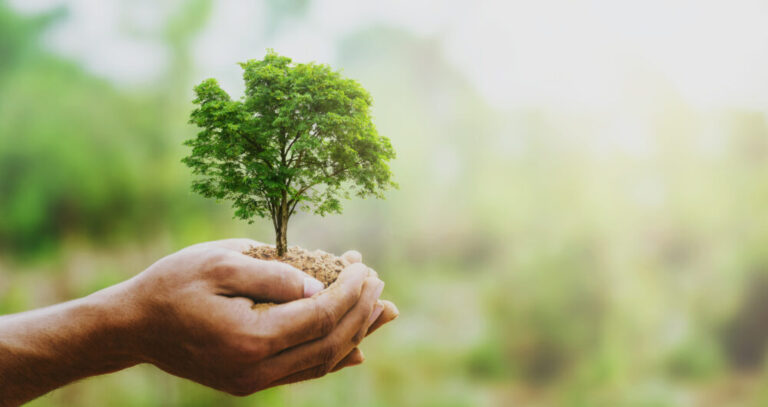

## Import Libaries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.dates as mdates

import warnings

from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from matplotlib.colors import ListedColormap

# Suppress the specific FutureWarning
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

In [2]:
pd.options.display.float_format = '{:,.2f}'.format

# Create locators for ticks on the time axis
years = mdates.YearLocator()
months = mdates.MonthLocator()
days = mdates.DateLocator()
years_fmt = mdates.DateFormatter('%Y')
dates_fmt = mdates.DateFormatter('%Y-%m-%D')


# Register date converters to avoid warning messages
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

## Read CSV file

In [3]:
df = pd.read_csv('/kaggle/input/plant-health-data/plant_health_data.csv', parse_dates=['Timestamp'])
display(df.head())

,Timestamp,Plant_ID,Soil_Moisture,Ambient_Temperature,Soil_Temperature,Humidity,Light_Intensity,Soil_pH,Nitrogen_Level,Phosphorus_Level,Potassium_Level,Chlorophyll_Content,Electrochemical_Signal,Plant_Health_Status
0,2024-10-03 10:54:53.407995,1,27.52,22.24,21.90,55.29,556.17,5.58,10.00,45.81,39.08,35.70,0.94,High Stress
1,2024-10-03 16:54:53.407995,1,14.84,21.71,18.68,63.95,596.14,7.14,30.71,25.39,17.94,27.99,0.16,High Stress
2,2024-10-03 22:54:53.407995,1,17.09,21.18,15.39,67.84,591.12,5.66,29.34,27.57,35.71,43.65,1.08,High Stress
3,2024-10-04 04:54:53.407995,1,15.34,22.59,22.78,58.19,241.41,5.58,16.97,26.18,26.26,37.84,1.19,High Stress
4,2024-10-04 10:54:53.407995,1,39.82,28.93,18.10,63.77,444.49,5.92,10.94,37.90,37.65,48.27,1.61,High Stress


In [4]:
print(f"The shape of the data: {df.shape}\n")
print(f"The number of null values: {df.isna().values.any().sum()}\n")
df.info()

The shape of the data: (1200, 14)

The number of null values: 0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Timestamp               1200 non-null   datetime64[ns]
 1   Plant_ID                1200 non-null   int64         
 2   Soil_Moisture           1200 non-null   float64       
 3   Ambient_Temperature     1200 non-null   float64       
 4   Soil_Temperature        1200 non-null   float64       
 5   Humidity                1200 non-null   float64       
 6   Light_Intensity         1200 non-null   float64       
 7   Soil_pH                 1200 non-null   float64       
 8   Nitrogen_Level          1200 non-null   float64       
 9   Phosphorus_Level        1200 non-null   float64       
 10  Potassium_Level         1200 non-null   float64       
 11  Chlorophyll_Content     1200 non-null   flo

### The data types are all numerical data

In [5]:
df.Plant_ID.value_counts()

Plant_ID
1     120
2     120
3     120
4     120
5     120
6     120
7     120
8     120
9     120
10    120
Name: count, dtype: int64

### According to the timestamp, the data is collected every 6 hours. There are 10 plants_ID, each plant has 120 reading

In [6]:
df.describe()

,Timestamp,Plant_ID,Soil_Moisture,Ambient_Temperature,Soil_Temperature,Humidity,Light_Intensity,Soil_pH,Nitrogen_Level,Phosphorus_Level,Potassium_Level,Chlorophyll_Content,Electrochemical_Signal
count,1200,"1,200.00","1,200.00","1,200.00","1,200.00","1,200.00","1,200.00","1,200.00","1,200.00","1,200.00","1,200.00","1,200.00","1,200.00"
mean,2024-10-18 07:54:53.458373376,5.50,25.11,24.00,19.96,54.85,612.64,6.52,30.11,30.26,30.11,34.75,0.99
min,2024-10-03 10:54:53.407995,1.00,10.00,18.00,15.00,40.03,200.62,5.51,10.00,10.02,10.00,20.03,0.00
25%,2024-10-10 21:24:53.429373184,3.00,17.13,21.10,17.35,47.02,416.88,6.03,20.25,20.89,19.59,27.46,0.49
50%,2024-10-18 07:54:53.450751488,5.50,25.17,23.89,19.91,54.69,617.24,6.54,30.14,30.02,30.50,34.43,0.98
75%,2024-10-25 18:24:53.472129792,8.00,32.37,27.04,22.60,62.45,811.47,7.03,40.18,40.13,40.11,42.23,1.47
max,2024-11-02 04:54:53.493508,10.00,39.99,29.99,25.00,69.97,999.86,7.50,49.95,49.98,49.98,49.99,2.00
std,NaN,2.87,8.68,3.44,2.93,8.78,228.32,0.58,11.51,11.47,11.67,8.77,0.58


### Exploring the target unique values, counts and verify of the data is balanced or not 

In [7]:
print(f"The plant health status are: {df.Plant_Health_Status.unique()}\n")

print(f"The count of each plant health status as follows: {df.Plant_Health_Status.value_counts()}\n")


The plant health status are: ['High Stress' 'Moderate Stress' 'Healthy']

The count of each plant health status as follows: Plant_Health_Status
High Stress        500
Moderate Stress    401
Healthy            299
Name: count, dtype: int64



### Let's check the correlation between features using df.corr() and heatmap

In [8]:
dfc = df.copy()
dfc['plant_health'] = dfc['Plant_Health_Status'].map({'High Stress': 1, 'Moderate Stress': 2, 'Healthy': 3})

In [9]:
num_features = ['Soil_Moisture', 'Ambient_Temperature','Soil_Temperature', 'Humidity', 'Light_Intensity', 'Soil_pH',
       'Nitrogen_Level', 'Phosphorus_Level', 'Potassium_Level','Chlorophyll_Content', 'Electrochemical_Signal', 'plant_health']

df_corr = dfc[num_features].corr(method="pearson")
df_corr

,Soil_Moisture,Ambient_Temperature,Soil_Temperature,Humidity,Light_Intensity,Soil_pH,Nitrogen_Level,Phosphorus_Level,Potassium_Level,Chlorophyll_Content,Electrochemical_Signal,plant_health
Soil_Moisture,1.00,-0.01,-0.03,0.05,-0.01,-0.04,-0.02,0.02,0.03,0.04,-0.01,0.77
Ambient_Temperature,-0.01,1.00,0.04,0.00,-0.03,-0.02,-0.01,-0.00,0.01,0.03,0.01,0.00
Soil_Temperature,-0.03,0.04,1.00,0.02,0.00,-0.03,-0.03,-0.04,-0.03,0.05,-0.02,0.01
Humidity,0.05,0.00,0.02,1.00,-0.02,0.01,-0.02,-0.00,0.01,0.02,0.01,0.04
Light_Intensity,-0.01,-0.03,0.00,-0.02,1.00,0.01,-0.01,-0.04,-0.03,0.02,-0.00,-0.03
Soil_pH,-0.04,-0.02,-0.03,0.01,0.01,1.00,-0.01,0.02,0.01,0.00,-0.02,-0.04
Nitrogen_Level,-0.02,-0.01,-0.03,-0.02,-0.01,-0.01,1.00,0.01,0.01,-0.05,-0.00,0.27
Phosphorus_Level,0.02,-0.00,-0.04,-0.00,-0.04,0.02,0.01,1.00,-0.02,0.00,-0.01,0.06
Potassium_Level,0.03,0.01,-0.03,0.01,-0.03,0.01,0.01,-0.02,1.00,-0.01,-0.01,0.02
Chlorophyll_Content,0.04,0.03,0.05,0.02,0.02,0.00,-0.05,0.00,-0.01,1.00,0.03,0.01


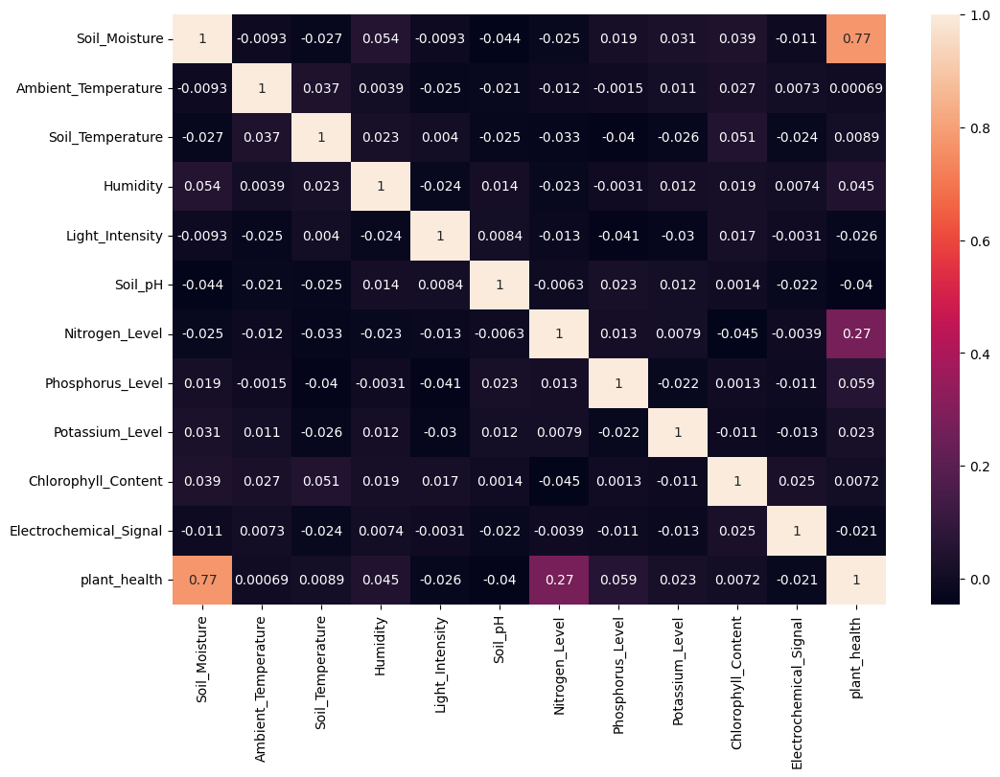

In [10]:
fig = plt.figure(figsize=(12,8))

ax = sns.heatmap(df_corr, annot=True)
plt.show()

## The heatmap shows that the plant health is highly correlated with Soil moisture and followed by Nitrogen level correlation

## Data Visualization

In [11]:
# create a box plot and KDE plot for a sample plant ID
def plot_kde_box(df, ID:int):
    # Set up warnings to be ignored (optional)
    warnings.filterwarnings("ignore")
    pd.set_option('mode.use_inf_as_na', False)
    numeric_features = df.select_dtypes(include=[np.number]).drop('Plant_ID',axis=1).columns.tolist()
    
    data = df[df['Plant_ID'] == ID]
    for column in numeric_features:
        fig, axes = plt.subplots(1, 2, figsize=(18, 4))  # Create subplots with 1 row and 2 columns

         # Plot KDE plot with hue
        sns.kdeplot(data=data, 
                    x=column,
                    hue='Plant_Health_Status', 
                    ax=axes[0], 
                    )
        
        axes[0].set_title(f'KDE Plot of {column} with Plant_Health_Status Hue')
        axes[0].set_xlabel(column)
        axes[0].set_ylabel('Density')
        axes[0].legend(title='Plant_Health_Status', loc='upper right')
        
        # Plot scatter with hue
        sns.boxplot(x='Plant_Health_Status',
                        y=column,
                        hue='Plant_Health_Status',
                        data=data,
                       ax=axes[1])

        axes[1].set_title(f'{column} Box plot')
        axes[1].set_xlabel('Timestamp')
        axes[1].set_ylabel(column)
        axes[1].legend(title='Plant_Health_Status', loc='upper right')
        
        plt.tight_layout()  # Adjust spacing between subplots
        plt.show()


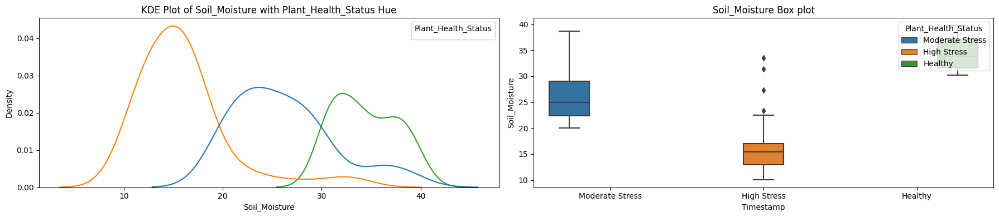

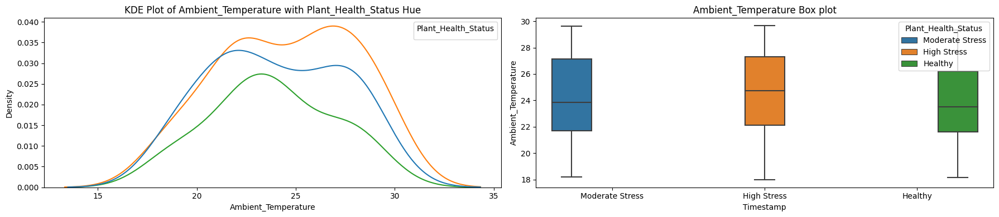

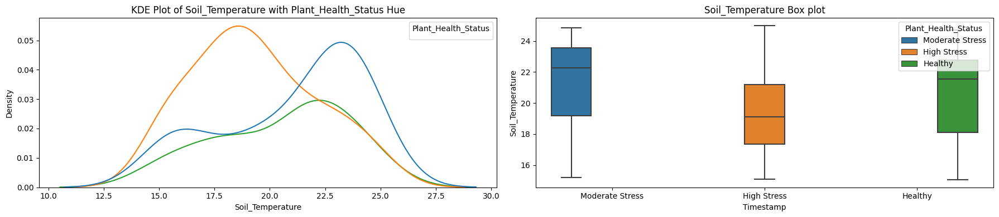

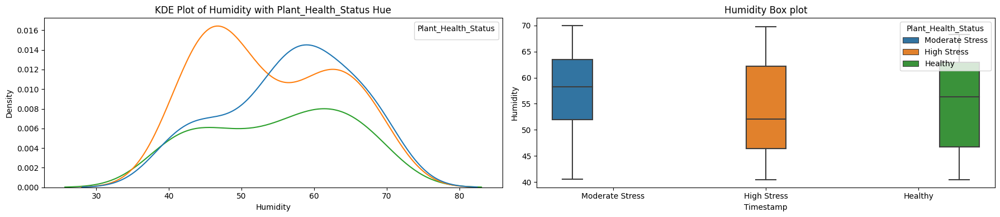

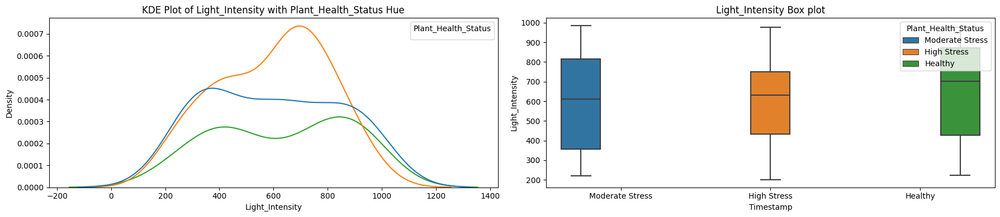

...

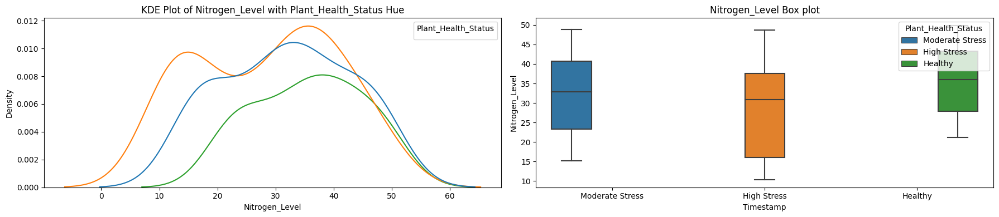

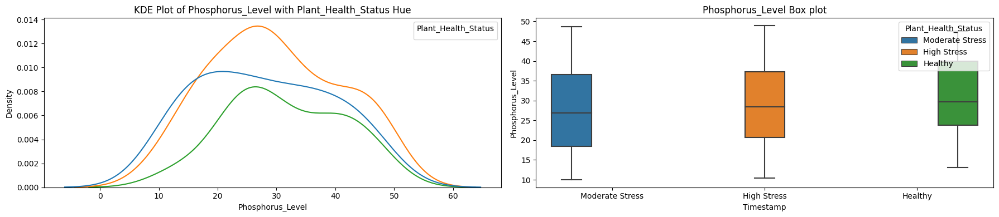

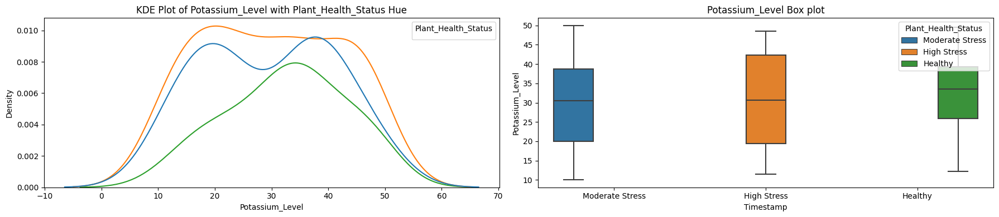

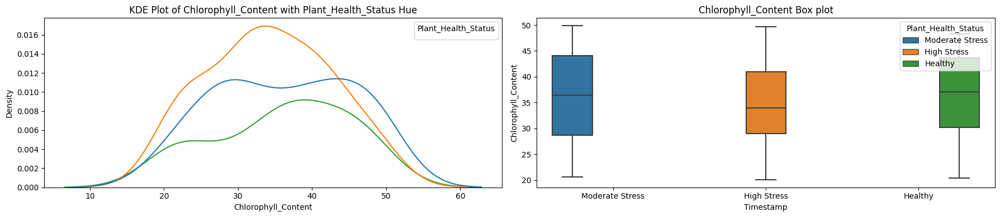

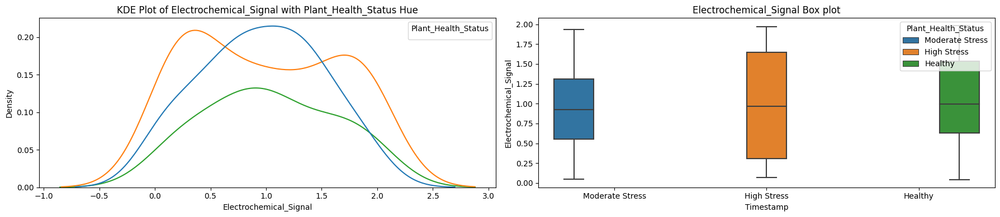

In [12]:
plot_kde_box(df, ID=10)

### Create a pair plot for a plant ID = 5  as an example

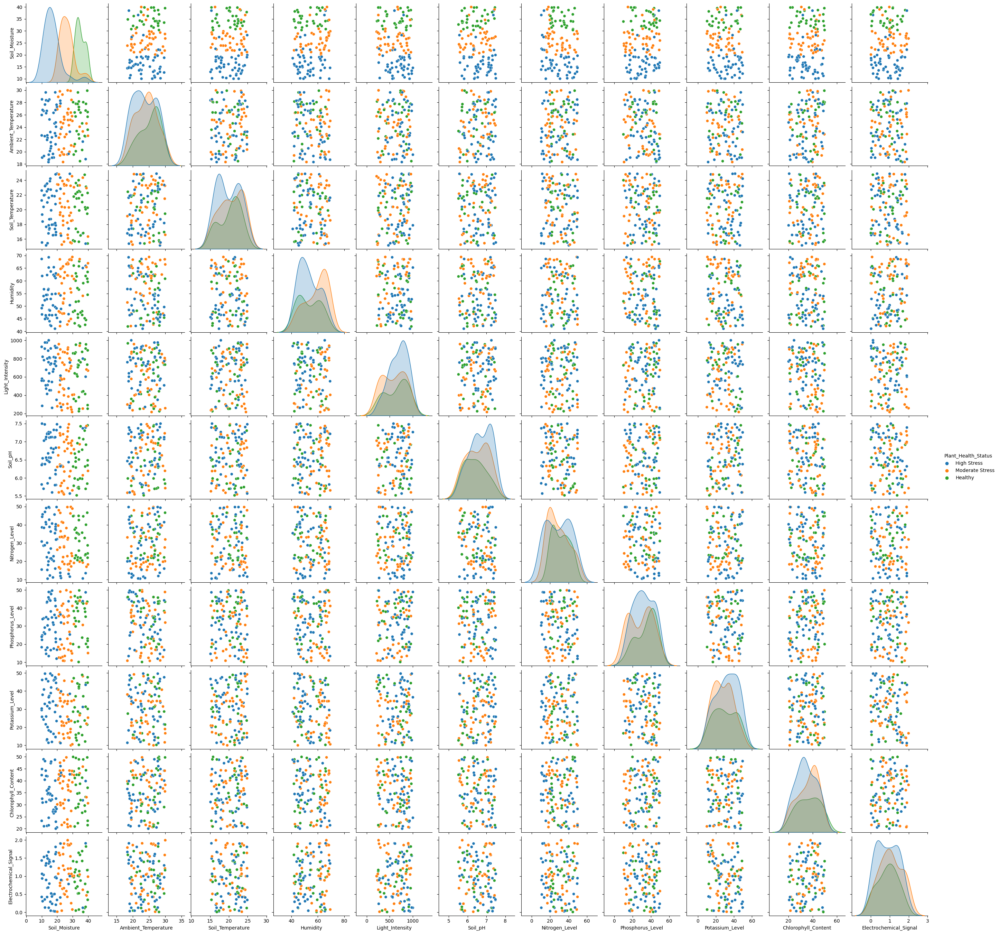

In [13]:
df_gr = df.query('Plant_ID == 5')
num_features = ['Soil_Moisture', 'Ambient_Temperature','Soil_Temperature', 'Humidity', 'Light_Intensity', 'Soil_pH',
       'Nitrogen_Level', 'Phosphorus_Level', 'Potassium_Level','Chlorophyll_Content', 'Electrochemical_Signal', 'Plant_Health_Status']

data1 = df_gr[num_features]
sns.pairplot(data=data1, hue='Plant_Health_Status')
plt.show()

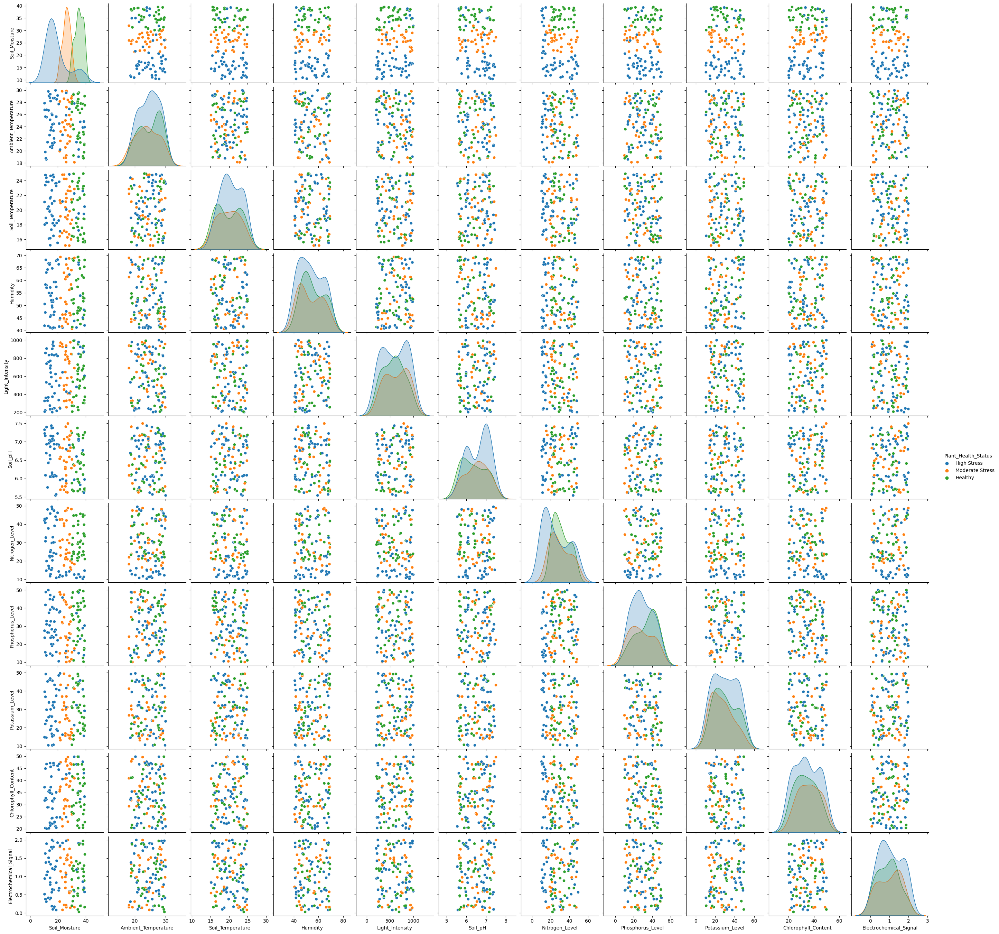

In [14]:
df_gr = df.query('Plant_ID == 2')
num_features = ['Soil_Moisture', 'Ambient_Temperature','Soil_Temperature', 'Humidity', 'Light_Intensity', 'Soil_pH',
       'Nitrogen_Level', 'Phosphorus_Level', 'Potassium_Level','Chlorophyll_Content', 'Electrochemical_Signal', 'Plant_Health_Status']

data1 = df_gr[num_features]
sns.pairplot(data=data1, hue='Plant_Health_Status')
plt.show()

### Pie plot for plant health status value counts

In [15]:
plh = df.Plant_Health_Status.value_counts()

pie = px.pie(labels=plh.index, 
             values=plh.values,
             title="Percentage of Plant Health Status",
             names=plh.index,
             hole=0.4,)

pie.update_traces(textposition='inside', textfont_size=15, textinfo='percent')

pie.show()

### scatter plot

In [16]:
numeric_features = df.select_dtypes(include=[np.number]).drop('Plant_ID',axis=1).columns.tolist()
numeric_features

['Soil_Moisture',
 'Ambient_Temperature',
 'Soil_Temperature',
 'Humidity',
 'Light_Intensity',
 'Soil_pH',
 'Nitrogen_Level',
 'Phosphorus_Level',
 'Potassium_Level',
 'Chlorophyll_Content',
 'Electrochemical_Signal']

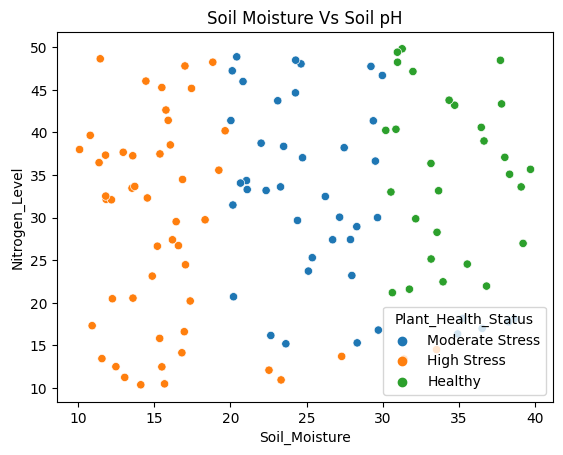

In [17]:
data = df[df['Plant_ID'] == 10]
ax = sns.scatterplot(x='Soil_Moisture',
                     y='Nitrogen_Level',
                     hue='Plant_Health_Status'
                     ,data=data)
ax.set_title("Soil Moisture Vs Soil pH")
plt.show()

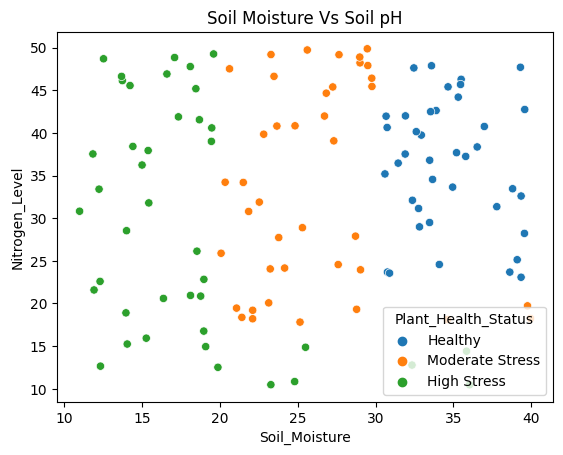

In [18]:
data = df[df['Plant_ID'] == 3]
ax = sns.scatterplot(x='Soil_Moisture',
                     y='Nitrogen_Level',
                     hue='Plant_Health_Status'
                     ,data=data)
ax.set_title("Soil Moisture Vs Soil pH")
plt.show()

### Let's explore each plant ID 

In [19]:
def scatterplot(df, ID:int):
    # Set up warnings to be ignored (optional)
    warnings.filterwarnings("ignore")
    pd.set_option('mode.use_inf_as_na', False)
    numeric_features = df.select_dtypes(include=[np.number]).drop('Plant_ID',axis=1).columns.tolist()
    
    data = df[df['Plant_ID'] == ID]
    for column in numeric_features:
        fig, axes = plt.subplots(1, 2, figsize=(18, 4))  # Create subplots with 1 row and 2 columns
    
        # Plot scatter with hue
        sns.scatterplot(x='Timestamp',
                        y=column,
                        hue='Plant_Health_Status',
                        data=data,
                       ax=axes[0])

        axes[0].set_title(f'{column} scatter plot')
        axes[0].set_xlabel('Timestamp')
        axes[0].set_ylabel(column)
        axes[0].legend(title='Plant_Health_Status', loc='upper right')
        
        # Plot KDE plot with hue
        sns.kdeplot(data=data, 
                    x=column,
                    hue='Plant_Health_Status', 
                    ax=axes[1], 
                    )
        
        axes[1].set_title(f'KDE Plot of {column} with Plant_Health_Status Hue')
        axes[1].set_xlabel(column)
        axes[1].set_ylabel('Density')
        axes[1].legend(title='Plant_Health_Status', loc='upper right')
        
        plt.tight_layout()  # Adjust spacing between subplots
        plt.show()

        


## Scatter plot and KDE plot for plant ID =1

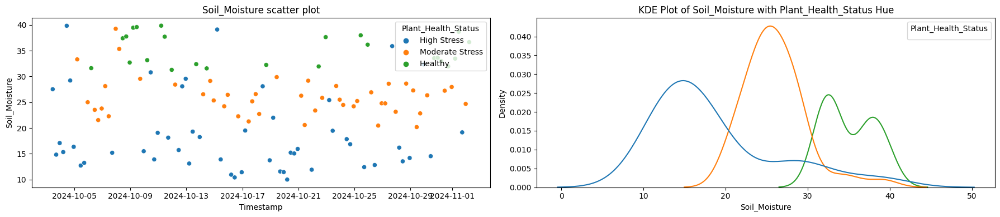

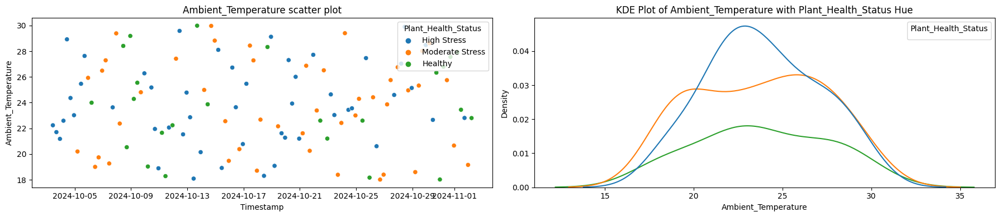

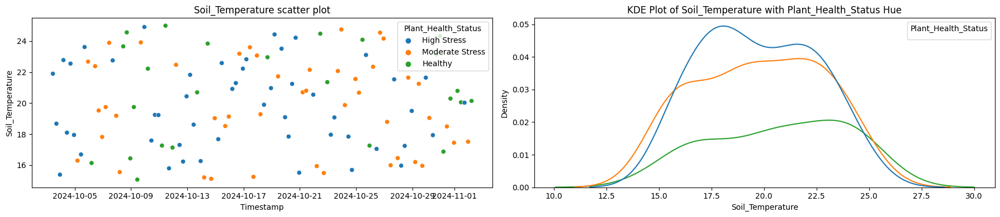

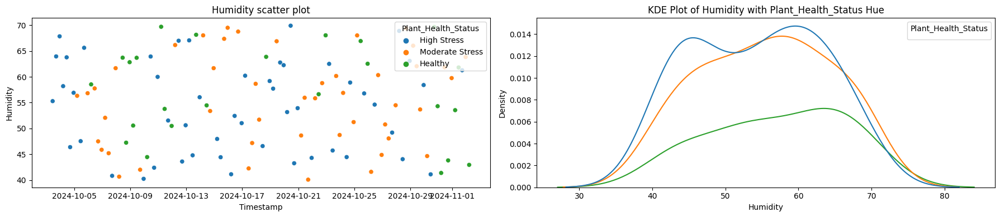

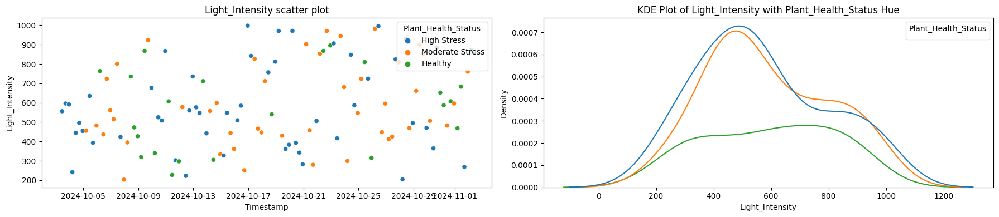

...

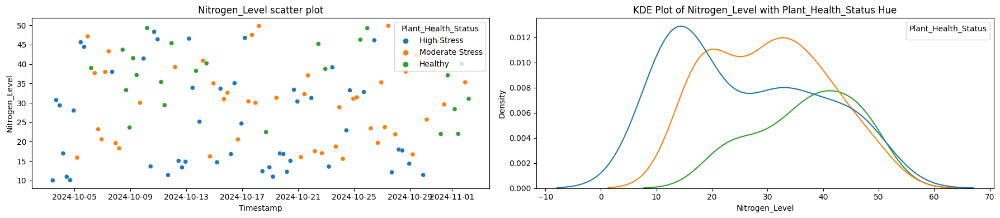

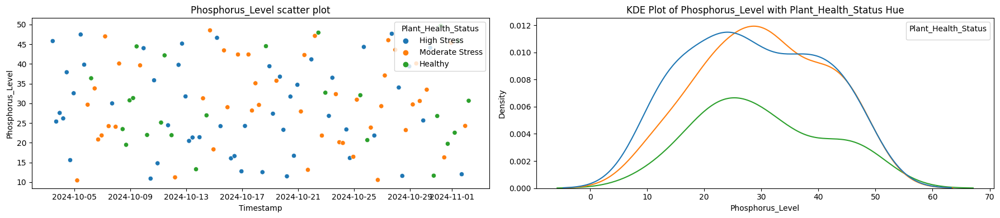

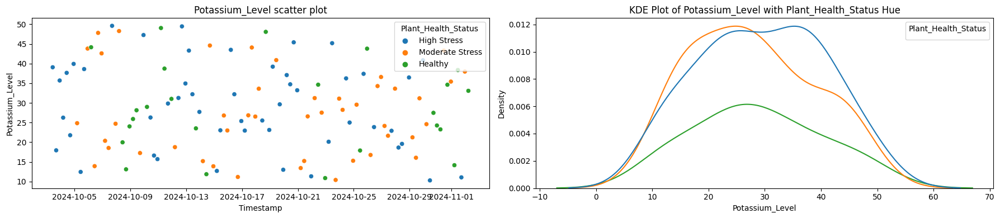

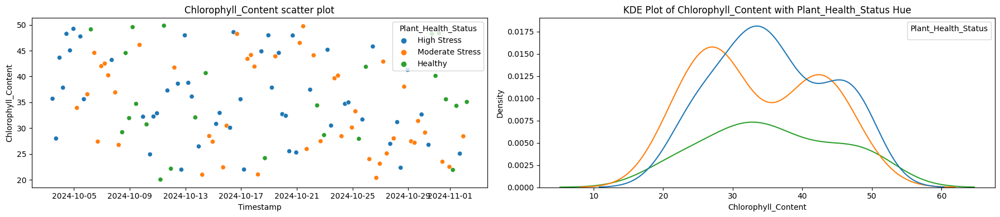

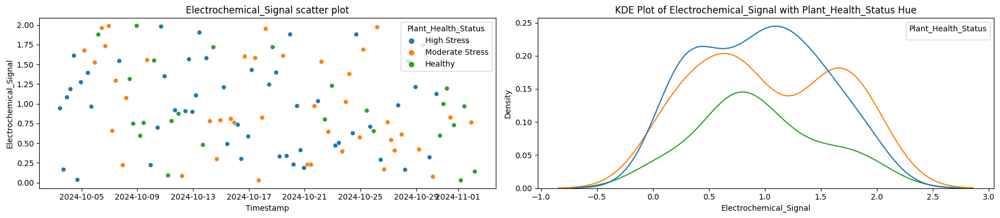

In [20]:
scatterplot(df, ID=1)

## Scatter plot and KDE plot for plant ID = 3

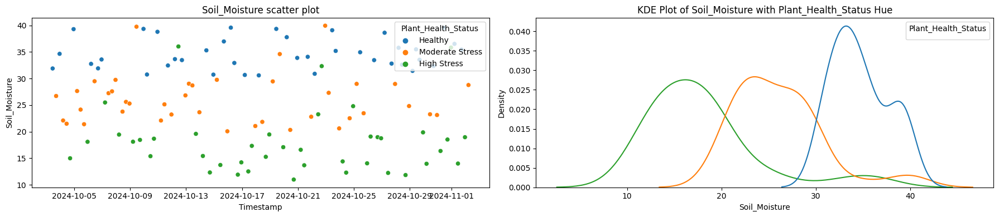

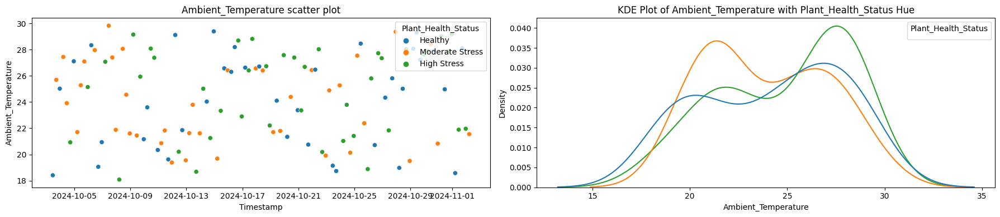

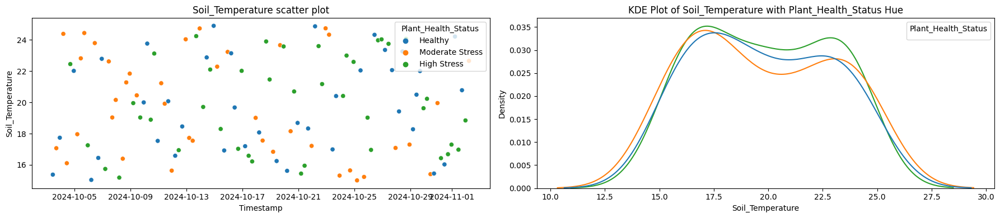

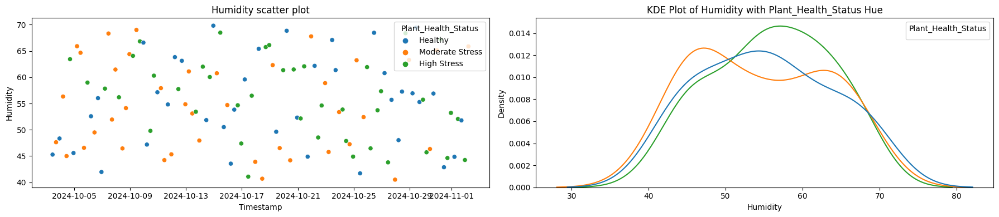

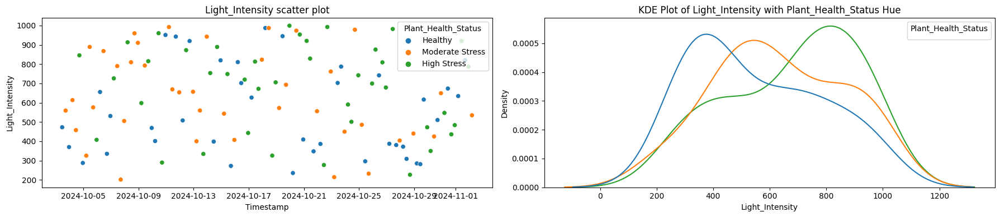

...

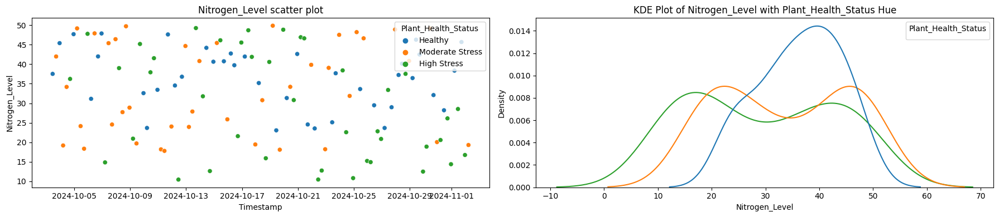

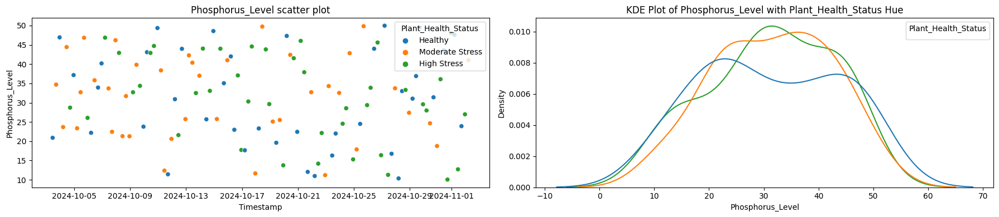

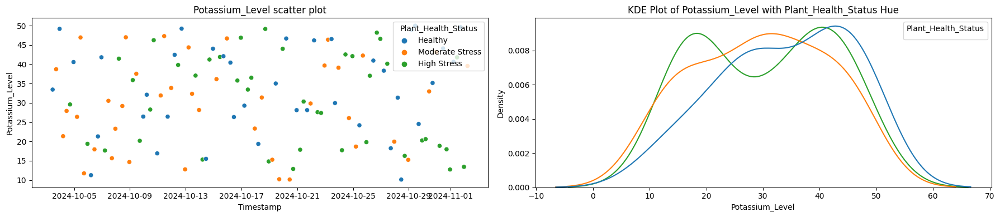

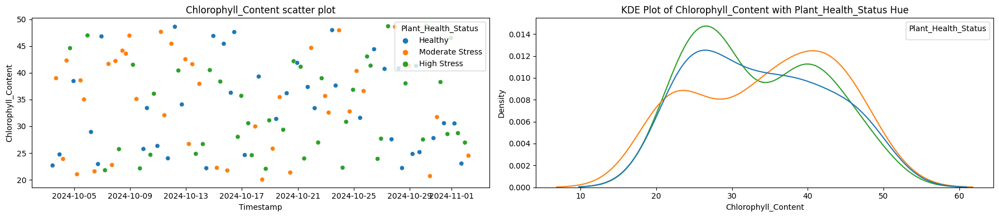

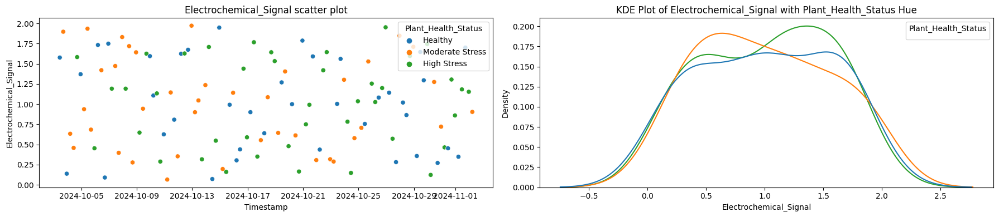

In [21]:
scatterplot(df, ID=3)

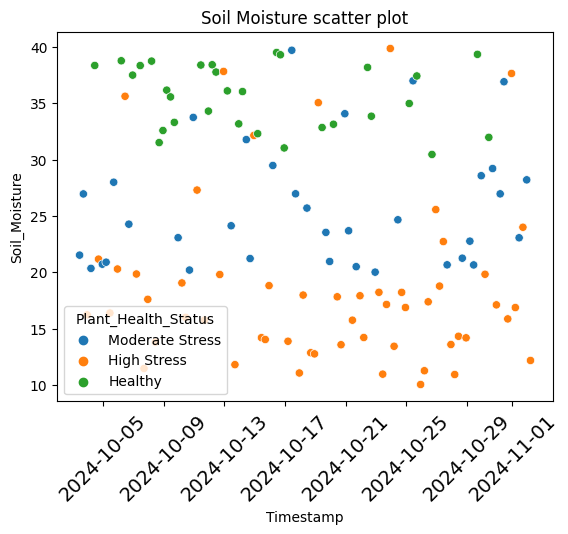

In [22]:
df1 = df[df['Plant_ID'] == 7]
plt.xticks(fontsize=14, rotation=45)

ax.xaxis.set_major_locator(days)
ax.xaxis.set_major_formatter(dates_fmt)

ax = sns.scatterplot(x='Timestamp',
                    y='Soil_Moisture',
                    hue='Plant_Health_Status',
                    data=df1)

ax.set_title('Soil Moisture scatter plot')

plt.show()

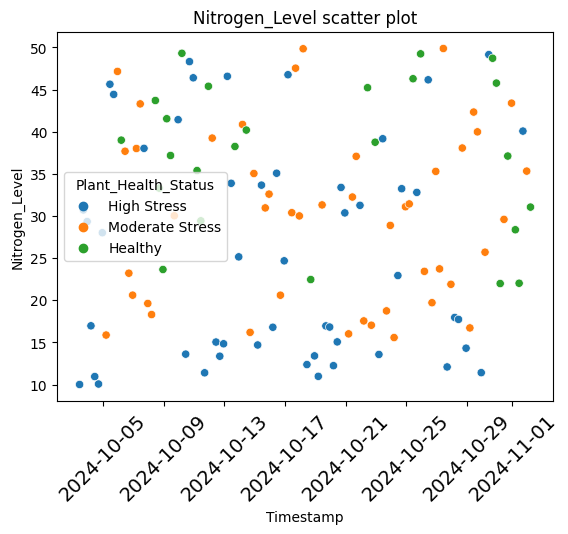

In [23]:
df1 = df[df['Plant_ID'] == 1]
plt.xticks(fontsize=14, rotation=45)

ax.xaxis.set_major_locator(days)
ax.xaxis.set_major_formatter(dates_fmt)

ax = sns.scatterplot(x='Timestamp',
                    y='Nitrogen_Level',
                    hue='Plant_Health_Status',
                    data=df1)

ax.set_title('Nitrogen_Level scatter plot')

plt.show()

In [24]:
df_group_id = df.groupby('Plant_ID')['Plant_Health_Status'].value_counts().reset_index()
df_group_id.head()

,Plant_ID,Plant_Health_Status,count
0,1,High Stress,50
1,1,Moderate Stress,46
2,1,Healthy,24
3,2,High Stress,53
4,2,Healthy,36


In [25]:
df_group_id.columns=['Plant_ID','Plant_Health_Status','count']
df_group_id.head()

,Plant_ID,Plant_Health_Status,count
0,1,High Stress,50
1,1,Moderate Stress,46
2,1,Healthy,24
3,2,High Stress,53
4,2,Healthy,36


## Classifier comparison

## we will use Soil moisture and Nitrogen level only as a feature and check the classifiers preformance

In [26]:
names = [
    "Nearest Neighbors",
    "Linear SVM",
    "RBF SVM",
    "Gaussian Process",
    "Decision Tree",
    "Random Forest",
    "Neural Net",
    "AdaBoost",
    "Naive Bayes",
    "QDA",
]

classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025, random_state=42),
    SVC(gamma=2, C=1, random_state=42),
    GaussianProcessClassifier(1.0 * RBF(1.0), random_state=42),
    DecisionTreeClassifier(max_depth=5, random_state=42),
    RandomForestClassifier(
        max_depth=5, n_estimators=10, max_features=1, random_state=42
    ),
    MLPClassifier(alpha=1, max_iter=1000, random_state=42),
    AdaBoostClassifier(algorithm="SAMME", random_state=42),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(),
]

In [27]:
data = df[['Soil_Moisture','Nitrogen_Level','Plant_Health_Status']]
data['Plant_Health_Status'] = data['Plant_Health_Status'].map({'High Stress': 1, 'Moderate Stress': 2, 'Healthy': 3})
data

,Soil_Moisture,Nitrogen_Level,Plant_Health_Status
0,27.52,10.00,1
1,14.84,30.71,1
2,17.09,29.34,1
3,15.34,16.97,1
4,39.82,10.94,1
...,...,...,...
1195,29.67,29.99,2
1196,15.49,45.26,1
1197,23.50,38.35,2
1198,30.97,49.40,3


In [28]:

data = data.sample(frac=1).reset_index(drop=True)
X = data[['Soil_Moisture','Nitrogen_Level']]
y = data['Plant_Health_Status']

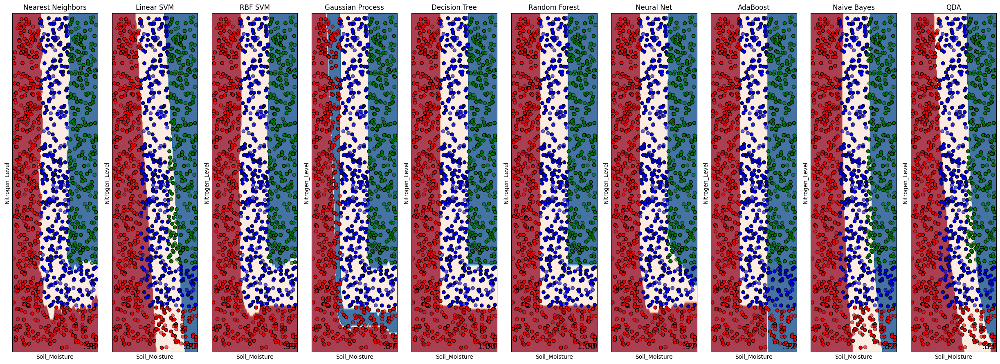

In [29]:


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

figure = plt.figure(figsize=(27, 9))
i = 1
cm = plt.cm.RdBu
cm_bright = ListedColormap(["#FF0000", "#0000FF", 'green'])
# iterate over classifiers
for name, clf in zip(names, classifiers):
        ax = plt.subplot(1, len(classifiers) + 1, i)

        clf = make_pipeline(StandardScaler(), clf)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)
        DecisionBoundaryDisplay.from_estimator(
            clf, X, cmap=cm, alpha=0.8, ax=ax, eps=0.5
        )

        # Plot the training points
        ax.scatter(
            X_train.loc[:, 'Soil_Moisture'], X_train.loc[:, 'Nitrogen_Level'], c=y_train, cmap=cm_bright, edgecolors="k"
        )
        # Plot the testing points
        ax.scatter(
            X_test.loc[:, 'Soil_Moisture'],
            X_test.loc[:, 'Nitrogen_Level'],
            c=y_test,
            cmap=cm_bright,
            edgecolors="k",
            alpha=0.6,
        )
        x_min, x_max = X.loc[:, 'Soil_Moisture'].min() - 0.5, X.loc[:, 'Soil_Moisture'].max() + 0.5
        y_min, y_max = X.loc[:, 'Nitrogen_Level'].min() - 0.5, X.loc[:, 'Nitrogen_Level'].max() + 0.5
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xticks(())
        ax.set_yticks(())
        ax.set_title(name)
        ax.text(
            x_max - 0.3,
            y_min + 0.3,
            ("%.2f" % score).lstrip("0"),
            size=15,
            horizontalalignment="right",
        )
        i += 1


plt.tight_layout()
plt.show()

## The best performing models are Nearest Neighbors, RBF SVM, Gaussian process, Decision Tree, Random Forest